In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

%matplotlib inline

from sklearn.model_selection import train_test_split

# ROC imports
from sklearn.metrics import roc_auc_score, make_scorer, accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, roc_curve, auc 
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

import re

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

# Additional Classification models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier




In [2]:
il_df = pd.read_excel('il_data3.xlsx')

In [3]:
# Safety dataframe
il_df_OG = il_df.copy()

In [4]:
il_df.head()

,entry_date,zipcode,city-state,medianlistingprice,medianlistingprice_mm,medianlistingprice_yy,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,...,totallistingcount_yy,pendingratio,pendingratio_mm,pendingratio_yy,City,State,month_no,year,y_median,y_mean
0,2019-04-01,60002,"Antioch, IL",250000.00,-0.0198,0.0038,186.0,0.1481,-0.1878,44.75,...,-0.2149,0.0215,-0.0032,-0.0353,Antioch,IL,4,2019,1,0
1,2019-04-01,60004,"Arlington Heights, IL",349956.25,0.0000,-0.0669,407.0,0.1274,0.0970,38.00,...,0.0959,0.0528,0.0030,-0.0011,Arlington Heights,IL,4,2019,1,1
2,2019-04-01,60005,"Arlington Heights, IL",355725.00,0.0047,-0.0489,232.5,0.2109,0.0764,35.50,...,0.1121,0.0667,-0.0063,0.0343,Arlington Heights,IL,4,2019,1,1
3,2019-04-01,60007,"Elk Grove Village, IL",299950.00,0.0166,0.0909,199.5,0.2547,0.2627,37.25,...,0.2349,0.0276,-0.0102,-0.0231,Elk Grove Village,IL,4,2019,0,0
4,2019-04-01,60008,"Rolling Meadows, IL",249950.00,0.0869,0.0870,142.0,0.1545,0.0290,38.25,...,0.0385,0.0458,-0.0111,0.0095,Rolling Meadows,IL,4,2019,1,1


# Data Prep

In [5]:
# drop unnecessary columns

il_df = il_df.drop(['y_mean','zipcode','entry_date', 'city-state', 'State', 'City', 'month_no','year'], axis =1)

In [6]:
# target vector
y = il_df['y_median']

# feature matrix
X = il_df.drop(['y_median'], axis=1)

In [7]:
# train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=4444)

X_train = 80% (train2 + validation)

X_train2 = 60% of data

X_val = 20% of data

X_test = 20% of data

# Model 1 - Baseline Model

### Train/Test Split - Accuracy Score

In [31]:
logreg1 = LogisticRegression(solver = 'liblinear') # Ride regression with C=1
logreg1.fit(X_train,y_train)
logreg1_acc_test = logreg1.score(X_test, y_test)
logreg1_acc_train = logreg1.score(X_train, y_train)
print("Train/Test Accuracy for Logistic Regression model on testing data: {:6.4f}".format(logreg1_acc_test))
print("Train/Test Accuracy for Logistic Regression model on training data: {:6.4f}".format(logreg1_acc_train))

Train/Test Accuracy for Logistic Regression model on testing data: 0.6331
Train/Test Accuracy for Logistic Regression model on training data: 0.6395


In [ ]:
# Model seems to not be over or underfitting on the training and test data.
# Next step, increase the accuracy

### Cross Validation - Performance Metrics 

In [32]:
# Train, Validate, Test split
X_train2, X_val, y_train2, y_val = train_test_split(X_train, y_train, 
                                                    test_size = 0.2, random_state=4444)

In [109]:
# X_train = 80% (train2 + validation)

# X_train2 = 60% of data
# X_val = 20% of data
# X_test = 20% of data

In [33]:
# 5 fold Cross Validation 
cv_lgreg1_acc = cross_val_score(logreg1, X_train, y_train, cv=5, scoring='accuracy').mean()
cv_lgreg1_pre = cross_val_score(logreg1, X_train, y_train, cv=5, scoring='precision').mean()
cv_lgreg1_rec = cross_val_score(logreg1, X_train, y_train, cv=5, scoring='recall').mean()
cv_lgreg1_f1 = cross_val_score(logreg1, X_train, y_train, cv=5, scoring='f1').mean()


print("CV Accuracy score for Logistic Regression model 1: {:6.4f}".format(cv_lgreg1_acc))
print("CV Precision score for Logistic Regression model 1: {:6.4f}".format(cv_lgreg1_pre))
print("CV Recall score for Logistic Regression model 1: {:6.4f}".format(cv_lgreg1_rec))
print("CV F1 score for Logistic Regression model 1: {:6.4f}".format(cv_lgreg1_f1))

CV Accuracy score for Logistic Regression model 1: 0.6387
CV Precision score for Logistic Regression model 1: 0.6904
CV Recall score for Logistic Regression model 1: 0.4996
CV F1 score for Logistic Regression model 1: 0.5797


### pairplot

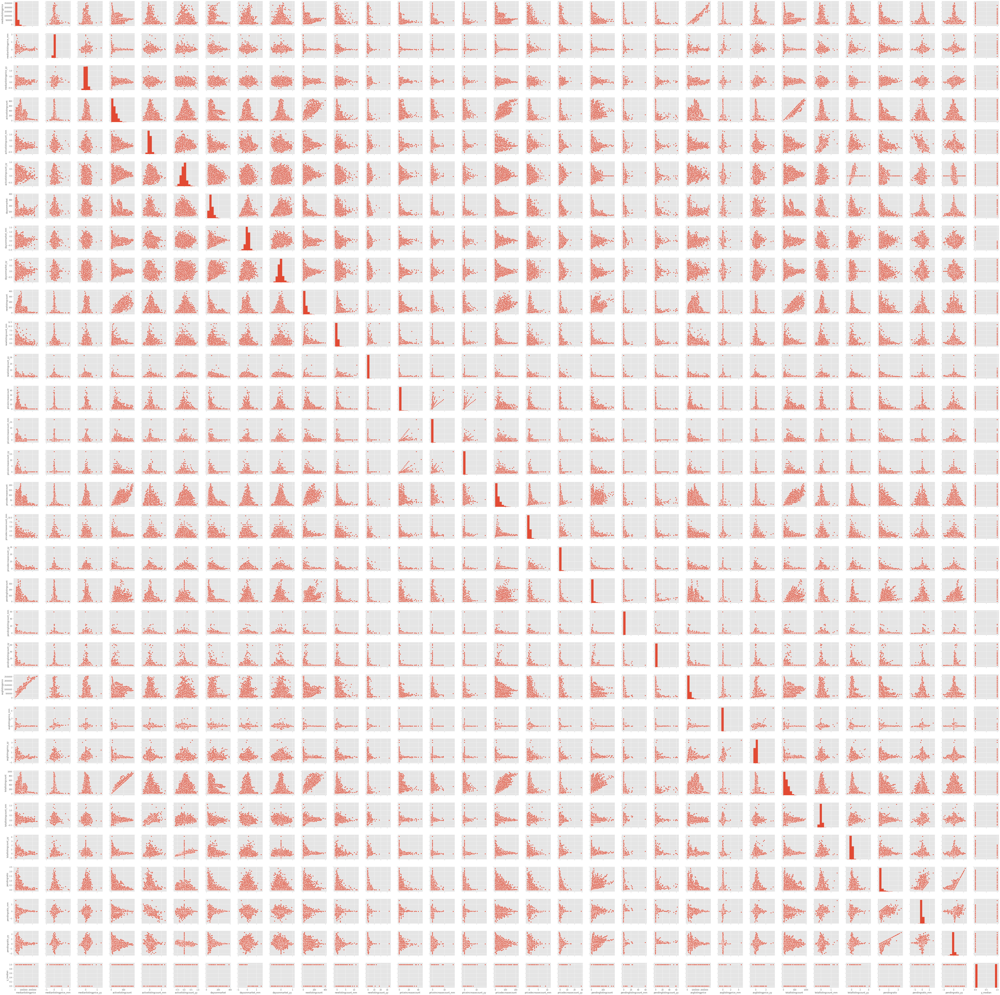

In [22]:
sns.pairplot(il_df)

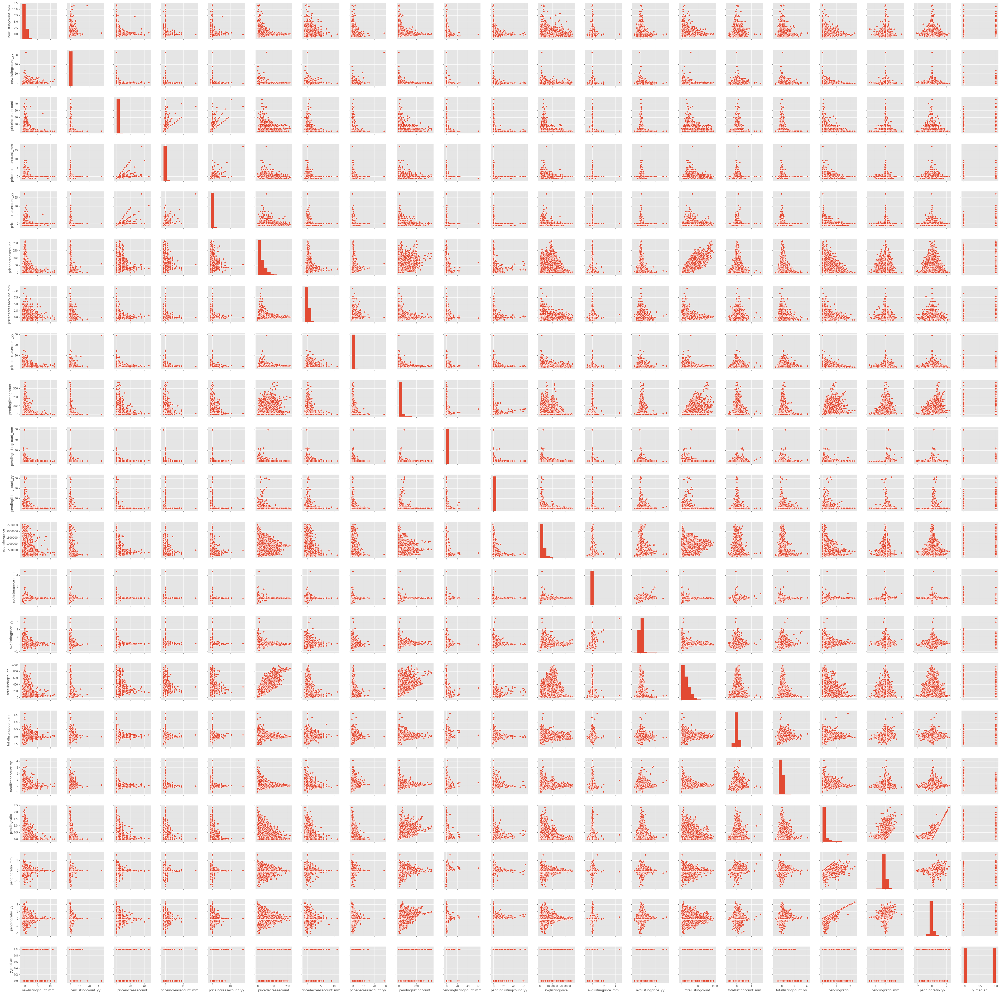

In [34]:
# Pairplots (1st half)
# Select everything after column 10

sns.pairplot(il_df.iloc[:, 10:])


### Correlation

In [38]:
il_df.corr()

,medianlistingprice,medianlistingprice_mm,medianlistingprice_yy,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,...,avglistingprice,avglistingprice_mm,avglistingprice_yy,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm,pendingratio_yy,y_median
medianlistingprice,1.000000,0.019972,0.022520,0.321325,0.035722,0.099840,-0.215806,0.002078,0.011977,0.325464,...,0.970582,-0.001543,0.012200,0.320559,0.034348,0.074579,0.001694,-0.008316,-0.025721,-0.029913
medianlistingprice_mm,0.019972,1.000000,0.161639,-0.025136,-0.000712,-0.020079,-0.020112,-0.080249,-0.010142,0.010014,...,0.002633,0.495381,0.144176,-0.019316,0.052598,-0.025877,0.045374,0.083391,0.021894,0.064629
medianlistingprice_yy,0.022520,0.161639,1.000000,0.019195,-0.001305,-0.097777,-0.104173,-0.007723,-0.063986,0.054116,...,0.000072,0.088771,0.445303,0.037911,-0.002648,-0.081395,0.107949,0.002590,0.093271,0.008072
activelistingcount,0.321325,-0.025136,0.019195,1.000000,0.053597,0.126775,-0.250840,-0.013743,-0.010271,0.864530,...,0.349266,-0.020888,-0.022702,0.976582,0.031941,0.044781,-0.068749,-0.042808,-0.106420,0.013705
activelistingcount_mm,0.035722,-0.000712,-0.001305,0.053597,1.000000,0.127049,-0.238515,-0.364419,-0.120129,0.187053,...,0.028562,-0.027831,-0.013460,0.047216,0.821627,0.134872,-0.061260,-0.438780,-0.072657,0.278538
activelistingcount_yy,0.099840,-0.020079,-0.097777,0.126775,0.127049,1.000000,-0.043298,0.031685,0.090956,0.098563,...,0.102520,-0.013218,-0.095044,0.116196,0.149365,0.653915,-0.062345,0.019881,-0.165906,-0.031856
daysonmarket,-0.215806,-0.020112,-0.104173,-0.250840,-0.238515,-0.043298,1.000000,0.218967,0.325018,-0.430926,...,-0.173749,-0.013002,-0.046564,-0.281630,-0.244275,-0.019591,-0.203753,0.021650,-0.002303,-0.194104
daysonmarket_mm,0.002078,-0.080249,-0.007723,-0.013743,-0.364419,0.031685,0.218967,1.000000,0.206670,-0.146168,...,0.005309,-0.052712,-0.003623,-0.018451,-0.431634,0.042830,-0.030867,-0.047234,-0.000076,-0.742708
daysonmarket_yy,0.011977,-0.010142,-0.063986,-0.010271,-0.120129,0.090956,0.325018,0.206670,1.000000,-0.061243,...,0.021000,-0.012172,-0.047780,-0.020331,-0.133399,0.067133,-0.080059,-0.006113,-0.118334,-0.172658
newlistingcount,0.325464,0.010014,0.054116,0.864530,0.187053,0.098563,-0.430926,-0.146168,-0.061243,1.000000,...,0.342115,0.004851,0.020885,0.884560,0.194887,0.047515,0.084501,-0.016490,-0.022512,0.140910


In [ ]:
# features with low correlations

# pending ratio_yy, avg listingprice_yy, pending listing count_yy, price increase count_yy
# newlistingcount_yy, DOM, median listingprice

### Coefficients and Intercept of Model 1

In [34]:
logreg1.coef_, logreg1.intercept_

(array([[-3.60167746e-07,  1.32623864e-04,  2.17151971e-05,
         -4.35752608e-03,  8.69840648e-04, -2.53219188e-04,
         -5.97139176e-05, -4.30547845e-03, -1.02524632e-03,
          4.38406190e-02,  2.07614134e-03,  1.48680472e-03,
          1.47304647e-03,  1.94577724e-04, -4.67660959e-05,
         -8.62250184e-03,  2.44896952e-03, -8.23385484e-05,
         -2.88792057e-04,  9.90963630e-04,  6.89965157e-05,
         -1.99012178e-07,  8.26958896e-05,  2.99537146e-05,
         -4.64631814e-03,  9.76580991e-04, -3.07695415e-04,
          2.00031440e-04,  1.37182014e-04,  1.80996884e-05]]),
 array([0.0012583]))

In [ ]:
# remove:
# pending ratio_yy, avg listingprice_yy, pending listing count_yy, price increase count_yy
# newlistingcount_yy, DOM, median listingprice

In [41]:
il_df.columns

Index(['medianlistingprice', 'medianlistingprice_mm', 'medianlistingprice_yy',
       'activelistingcount', 'activelistingcount_mm', 'activelistingcount_yy',
       'daysonmarket', 'daysonmarket_mm', 'daysonmarket_yy', 'newlistingcount',
       'newlistingcount_mm', 'newlistingcount_yy', 'priceincreasecount',
       'priceincreasecount_mm', 'priceincreasecount_yy', 'pricedecreasecount',
       'pricedecreasecount_mm', 'pricedecreasecount_yy', 'pendinglistingcount',
       'pendinglistingcount_mm', 'pendinglistingcount_yy', 'avglistingprice',
       'avglistingprice_mm', 'avglistingprice_yy', 'totallistingcount',
       'totallistingcount_mm', 'totallistingcount_yy', 'pendingratio',
       'pendingratio_mm', 'pendingratio_yy', 'y_median'],
      dtype='object')

### Predictions

In [35]:
y_predict=logreg1.predict(X_test)

In [36]:
y_predict_proba = logreg1.predict_proba(X_test)[:,1]

### ROC/AUC Score

In [ ]:
# X_train = 80% (train2 + validation)

# X_train2 = 60% of data
# X_val = 20% of data
# X_test = 20% of data

Area under ROC score =  0.6921617452725244


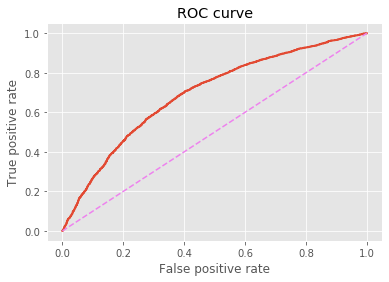

In [37]:
logreg1.fit(X_train, y_train)
fpr, tpr, thresholds = roc_curve(y_test, logreg1.predict_proba(X_test)[:,1])

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])


plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve');
#print("ROC AUC score = ", roc_auc_score(y_test, logreg.predict_proba(X_test)[:,1]))
print("Area under ROC score = ", auc(fpr,tpr))

# Model 2 - Remove Features

## Relative Feature Importance with Logistic Regression model (Gini Importance) 

In [38]:
# remove days on market and target to help with feature importance
X_sc = il_df.drop(['daysonmarket','daysonmarket_yy','daysonmarket_mm','y_median'], axis=1)

In [39]:
X_sc.head()

,medianlistingprice,medianlistingprice_mm,medianlistingprice_yy,activelistingcount,activelistingcount_mm,activelistingcount_yy,newlistingcount,newlistingcount_mm,newlistingcount_yy,priceincreasecount,...,pendinglistingcount_yy,avglistingprice,avglistingprice_mm,avglistingprice_yy,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm,pendingratio_yy
0,250000.00,-0.0198,0.0038,186.0,0.1481,-0.1878,68,0.1333,0.0000,0,...,-0.6923,294296,-0.0230,0.0387,190.0,0.1446,-0.2149,0.0215,-0.0032,-0.0353
1,349956.25,0.0000,-0.0669,407.0,0.1274,0.0970,206,0.3205,0.2875,0,...,0.0750,404348,0.0071,-0.0821,428.5,0.1306,0.0959,0.0528,0.0030,-0.0011
2,355725.00,0.0047,-0.0489,232.5,0.2109,0.0764,98,0.2250,-0.0577,0,...,1.2143,381492,-0.0065,-0.0494,248.0,0.2039,0.1121,0.0667,-0.0063,0.0343
3,299950.00,0.0166,0.0909,199.5,0.2547,0.2627,84,0.0000,0.3125,0,...,-0.3125,300549,0.0177,0.0618,205.0,0.2424,0.2349,0.0276,-0.0102,-0.0231
4,249950.00,0.0869,0.0870,142.0,0.1545,0.0290,58,0.0357,-0.2368,0,...,0.3000,257328,0.0486,0.0547,148.5,0.1423,0.0385,0.0458,-0.0111,0.0095


In [40]:
#Scale data
scaler = StandardScaler()
scaler.fit(X_sc) 
X_scaled = pd.DataFrame(scaler.transform(X_sc),columns = X_sc.columns)

In [41]:
# fit model to scaled data
logreg1_fit_scaled = logreg1.fit(X_scaled, y)

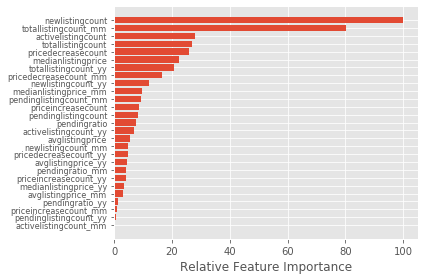

In [46]:
# Feature importance
feature_importance = abs(logreg1.coef_[0])
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5


featfig = plt.figure()
featax = featfig.add_subplot(1, 1, 1)
featax.barh(pos, feature_importance[sorted_idx], align='center')
featax.set_yticks(pos)
featax.set_yticklabels(np.array(X_sc.columns)[sorted_idx], fontsize=8)
featax.set_xlabel('Relative Feature Importance')

plt.tight_layout()   
plt.show()

In [ ]:
# Features with Little relative importance: 
# activelistingcount_mm, pendinglistingcount_yy, pricingincrease_mm, pendingratio_yy

## Relative Feature Importance with a Random Forest 

In [47]:
from sklearn.ensemble import RandomForestClassifier

In [53]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
rfc_acc = rfc.score(X_test, y_test)
print("Accuracy on Random Forest: {:6.4f}".format(rfc_acc))

/Users/ronald-daley/anaconda3/anaconda3/envs/metis/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Accuracy on Random Forest: 0.9999


In [55]:
# create a dataframe for relevant columns for feature importance
X_train_rfc = X_train.drop(['daysonmarket','daysonmarket_yy','daysonmarket_mm'], axis=1)

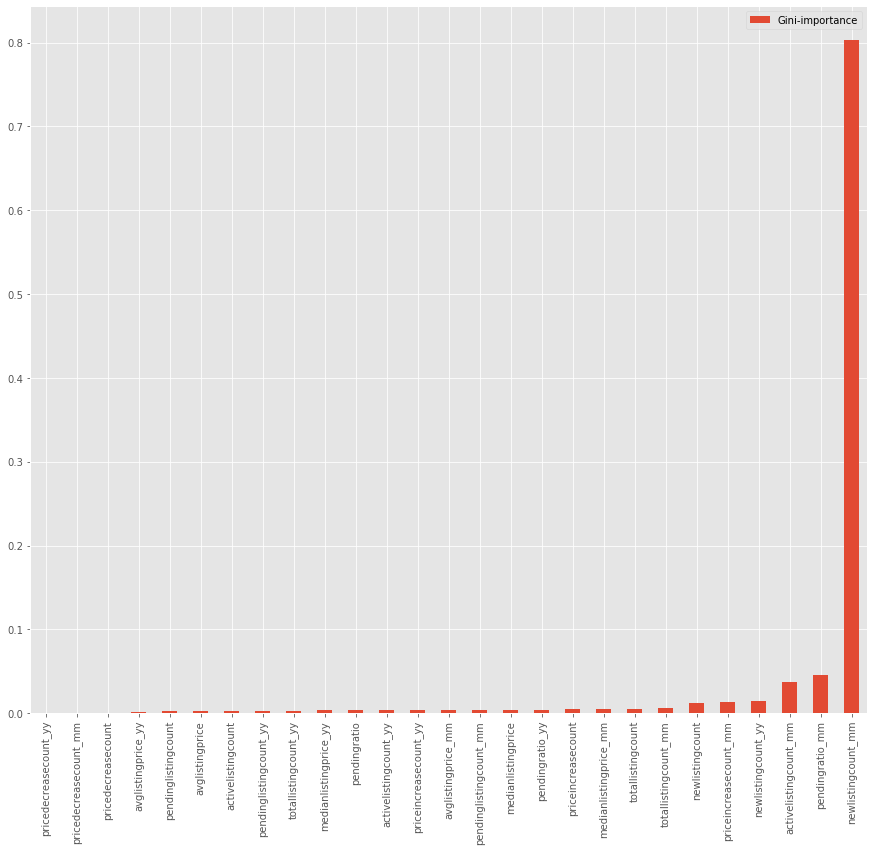

In [56]:
%matplotlib inline

feats = {} # a dict to hold feature_name: feature_importance

for feature, importance in zip(X_train_rfc.columns, rfc.feature_importances_):
   feats[feature] = importance #add the name/value pair

importances = pd.DataFrame.from_dict(feats,orient='index').rename(columns={0: 'Gini-importance'})
#pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance’})
importances.sort_values(by='Gini-importance').plot(kind='bar',figsize=(15,13));

## Model 2a (via Feature Importance)

In [ ]:
# Features with little relative importance: 
# activelistingcount_mm, pendinglistingcount_yy, pricingincrease_mm, pendingratio_yy

### DataFrame 2

In [58]:
X2 = il_df.drop(['daysonmarket','daysonmarket_yy','daysonmarket_mm','y_median', 'activelistingcount_mm', 'pendinglistingcount_yy', 'priceincreasecount_mm', 'pendingratio_yy'], axis=1)

y2 = il_df['y_median']

In [59]:
# 23 Features
X2.head()

,medianlistingprice,medianlistingprice_mm,medianlistingprice_yy,activelistingcount,activelistingcount_yy,newlistingcount,newlistingcount_mm,newlistingcount_yy,priceincreasecount,priceincreasecount_yy,...,pendinglistingcount,pendinglistingcount_mm,avglistingprice,avglistingprice_mm,avglistingprice_yy,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm
0,250000.00,-0.0198,0.0038,186.0,-0.1878,68,0.1333,0.0000,0,0.0,...,4.0,0.0000,294296,-0.0230,0.0387,190.0,0.1446,-0.2149,0.0215,-0.0032
1,349956.25,0.0000,-0.0669,407.0,0.0970,206,0.3205,0.2875,0,0.0,...,21.5,0.1944,404348,0.0071,-0.0821,428.5,0.1306,0.0959,0.0528,0.0030
2,355725.00,0.0047,-0.0489,232.5,0.0764,98,0.2250,-0.0577,0,0.0,...,15.5,0.1071,381492,-0.0065,-0.0494,248.0,0.2039,0.1121,0.0667,-0.0063
3,299950.00,0.0166,0.0909,199.5,0.2627,84,0.0000,0.3125,0,0.0,...,5.5,-0.0833,300549,0.0177,0.0618,205.0,0.2424,0.2349,0.0276,-0.0102
4,249950.00,0.0869,0.0870,142.0,0.0290,58,0.0357,-0.2368,0,0.0,...,6.5,-0.0714,257328,0.0486,0.0547,148.5,0.1423,0.0385,0.0458,-0.0111


### Train-test split of DataFrame 2

In [60]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, 
                                                    test_size = 0.2, random_state=4444)

In [61]:
# IMPORTANT NOTE: y_train2 is now redefined based on DF2

### Train/Test Split - Peformance Score

In [65]:
logreg2 = LogisticRegression(solver = 'liblinear' )
logreg2.fit(X_train2,y_train2)
logreg2_acc = logreg2.score(X_test2, y_test2)
print("Train/Test Accuracy on Logistic Regression model 2: {:6.3f}".format(logreg2_acc))

Train/Test Accuracy on Logistic Regression model 2:  0.635


### Cross Validation Score

In [66]:
cv_lgreg_acc2 = cross_val_score(logreg2, X_train2, y_train2, cv=5, scoring='accuracy').mean()


In [67]:
cv_lgreg_acc2

0.6398601700333114

## Model 2b (via Correlation)

### DataFrame 3

In [69]:
il_df.corr()

,medianlistingprice,medianlistingprice_mm,medianlistingprice_yy,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,...,avglistingprice,avglistingprice_mm,avglistingprice_yy,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm,pendingratio_yy,y_median
medianlistingprice,1.000000,0.019972,0.022520,0.321325,0.035722,0.099840,-0.215806,0.002078,0.011977,0.325464,...,0.970582,-0.001543,0.012200,0.320559,0.034348,0.074579,0.001694,-0.008316,-0.025721,-0.029913
medianlistingprice_mm,0.019972,1.000000,0.161639,-0.025136,-0.000712,-0.020079,-0.020112,-0.080249,-0.010142,0.010014,...,0.002633,0.495381,0.144176,-0.019316,0.052598,-0.025877,0.045374,0.083391,0.021894,0.064629
medianlistingprice_yy,0.022520,0.161639,1.000000,0.019195,-0.001305,-0.097777,-0.104173,-0.007723,-0.063986,0.054116,...,0.000072,0.088771,0.445303,0.037911,-0.002648,-0.081395,0.107949,0.002590,0.093271,0.008072
activelistingcount,0.321325,-0.025136,0.019195,1.000000,0.053597,0.126775,-0.250840,-0.013743,-0.010271,0.864530,...,0.349266,-0.020888,-0.022702,0.976582,0.031941,0.044781,-0.068749,-0.042808,-0.106420,0.013705
activelistingcount_mm,0.035722,-0.000712,-0.001305,0.053597,1.000000,0.127049,-0.238515,-0.364419,-0.120129,0.187053,...,0.028562,-0.027831,-0.013460,0.047216,0.821627,0.134872,-0.061260,-0.438780,-0.072657,0.278538
activelistingcount_yy,0.099840,-0.020079,-0.097777,0.126775,0.127049,1.000000,-0.043298,0.031685,0.090956,0.098563,...,0.102520,-0.013218,-0.095044,0.116196,0.149365,0.653915,-0.062345,0.019881,-0.165906,-0.031856
daysonmarket,-0.215806,-0.020112,-0.104173,-0.250840,-0.238515,-0.043298,1.000000,0.218967,0.325018,-0.430926,...,-0.173749,-0.013002,-0.046564,-0.281630,-0.244275,-0.019591,-0.203753,0.021650,-0.002303,-0.194104
daysonmarket_mm,0.002078,-0.080249,-0.007723,-0.013743,-0.364419,0.031685,0.218967,1.000000,0.206670,-0.146168,...,0.005309,-0.052712,-0.003623,-0.018451,-0.431634,0.042830,-0.030867,-0.047234,-0.000076,-0.742708
daysonmarket_yy,0.011977,-0.010142,-0.063986,-0.010271,-0.120129,0.090956,0.325018,0.206670,1.000000,-0.061243,...,0.021000,-0.012172,-0.047780,-0.020331,-0.133399,0.067133,-0.080059,-0.006113,-0.118334,-0.172658
newlistingcount,0.325464,0.010014,0.054116,0.864530,0.187053,0.098563,-0.430926,-0.146168,-0.061243,1.000000,...,0.342115,0.004851,0.020885,0.884560,0.194887,0.047515,0.084501,-0.016490,-0.022512,0.140910


In [ ]:
# remove the year over year columns due to low correlation with target

In [9]:
il_df.columns

Index(['medianlistingprice', 'medianlistingprice_mm', 'medianlistingprice_yy',
       'activelistingcount', 'activelistingcount_mm', 'activelistingcount_yy',
       'daysonmarket', 'daysonmarket_mm', 'daysonmarket_yy', 'newlistingcount',
       'newlistingcount_mm', 'newlistingcount_yy', 'priceincreasecount',
       'priceincreasecount_mm', 'priceincreasecount_yy', 'pricedecreasecount',
       'pricedecreasecount_mm', 'pricedecreasecount_yy', 'pendinglistingcount',
       'pendinglistingcount_mm', 'pendinglistingcount_yy', 'avglistingprice',
       'avglistingprice_mm', 'avglistingprice_yy', 'totallistingcount',
       'totallistingcount_mm', 'totallistingcount_yy', 'pendingratio',
       'pendingratio_mm', 'pendingratio_yy', 'y_median'],
      dtype='object')

In [18]:
il_df3 = il_df.drop(['pendingratio_yy','avglistingprice_yy', 'pendinglistingcount_yy', 'priceincreasecount_yy','newlistingcount_yy','medianlistingprice_yy'], axis=1)

In [19]:
il_df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37011 entries, 0 to 37010
Data columns (total 25 columns):
medianlistingprice        37011 non-null float64
medianlistingprice_mm     37011 non-null float64
activelistingcount        37011 non-null float64
activelistingcount_mm     37011 non-null float64
activelistingcount_yy     37011 non-null float64
daysonmarket              37011 non-null float64
daysonmarket_mm           37011 non-null float64
daysonmarket_yy           37011 non-null float64
newlistingcount           37011 non-null int64
newlistingcount_mm        37011 non-null float64
priceincreasecount        37011 non-null int64
priceincreasecount_mm     37011 non-null float64
pricedecreasecount        37011 non-null int64
pricedecreasecount_mm     37011 non-null float64
pricedecreasecount_yy     37011 non-null float64
pendinglistingcount       37011 non-null float64
pendinglistingcount_mm    37011 non-null float64
avglistingprice           37011 non-null int64
avglistingprice_m

In [20]:
# target vector3
y3 = il_df3['y_median']

# feature matrix3
X3 = il_df3.drop(['y_median'], axis=1)

### Train/test split of DataFrame 3

In [21]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, y3, 
                                                    test_size = 0.2, random_state=4444)

### Train/Test Split - Performance Score

#### Test Score

In [22]:
logreg3 = LogisticRegression(solver='liblinear')
logreg3.fit(X_train3,y_train3)
logreg3_acc = logreg3.score(X_test3, y_test3)
print("Train/Test Accuracy on Logistic Regression model 2: {:6.6f}".format(logreg3_acc))

Train/Test Accuracy on Logistic Regression model 2: 0.634878


#### Training Score

In [23]:
logreg3_train = logreg3.fit(X_train3,y_train3)
logreg3_train_acc = logreg3_train.score(X_train3, y_train3)
print("Train/Test Accuracy on Logistic Regression model 2: {:6.6f}".format(logreg3_train_acc))

Train/Test Accuracy on Logistic Regression model 2: 0.638983


### Cross Validation for Model 2b

In [18]:
cv_lgreg_acc3 = cross_val_score(logreg3, X_train3, y_train3, cv=5, scoring='accuracy').mean()
cv_lgreg_acc3

0.6477614344852685

In [19]:
# Cross Validation 
cv_lgreg_acc3 = cross_val_score(logreg3, X_train3, y_train3, cv=5, scoring='accuracy').mean()
cv_lgreg_pre3 = cross_val_score(logreg3, X_train3, y_train3, cv=5, scoring='precision').mean()
cv_lgreg_rec3 = cross_val_score(logreg3, X_train3, y_train3, cv=5, scoring='recall').mean()
cv_lgreg_f13 = cross_val_score(logreg3, X_train3, y_train3, cv=5, scoring='f1').mean()


print("CV Accuracy score for Logistic Regression model 3: {:6.3f}".format(cv_lgreg_acc3))
print("CV Precision score for Logistic Regression model 3: {:6.3f}".format(cv_lgreg_pre3))
print("CV Recall score for Logistic Regression model 3: {:6.3f}".format(cv_lgreg_rec3))
print("CV F1 score for Logistic Regression model 3: {:6.3f}".format(cv_lgreg_f13)) 

CV Accuracy score for Logistic Regression model 3:  0.648
CV Precision score for Logistic Regression model 3:  0.698
CV Recall score for Logistic Regression model 3:  0.516
CV F1 score for Logistic Regression model 3:  0.593


In [79]:
cv_lgreg_acc3

0.6387793570842477

### ROC/AUC for Model 2b

Area under ROC score =  0.692788683606143


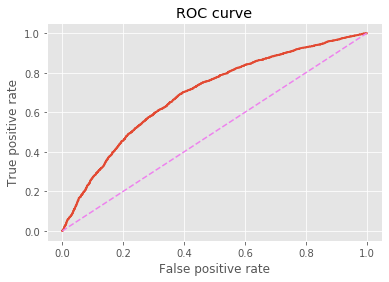

In [21]:
fpr, tpr, thresholds = roc_curve(y_test3, logreg3.predict_proba(X_test3)[:,1])

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])


plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve');
#print("ROC AUC score = ", roc_auc_score(y_test3, logreg3.predict_proba(X_test3)[:,1]))
print("Area under ROC score = ", auc(fpr,tpr))

## Model 2c (Feature Importance + Correlation)

#### DataFrame 4

In [82]:
il_df4 = il_df.drop(['daysonmarket','daysonmarket_yy','daysonmarket_mm', 'activelistingcount_mm', 'priceincreasecount_mm','pendingratio_yy','avglistingprice_yy', 'pendinglistingcount_yy', 'priceincreasecount_yy','newlistingcount_yy','medianlistingprice_yy'], axis=1)


In [83]:
# target vector4
y4 = il_df4['y_median']

# feature matrix4
X4 = il_df4.drop(['y_median'], axis=1)

#### Train/Test split

In [84]:
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, y4, 
                                                    test_size = 0.2, random_state=4444)

#### Train/Test Performance Metrics

In [85]:
logreg4 = LogisticRegression(solver='liblinear')
logreg4.fit(X_train4,y_train4)
logreg4_acc = logreg4.score(X_test4, y_test4)
print("Train/Test Accuracy on Logistic Regression model 2: {:6.3f}".format(logreg4_acc))

Train/Test Accuracy on Logistic Regression model 2:  0.635


#### Cross Validation

In [86]:
cv_lgreg_acc4 = cross_val_score(logreg4, X_train4, y_train4, cv=5, scoring='accuracy').mean()
cv_lgreg_acc4

0.6396575015651472

# Parameter Tuning

In [1]:
# Parameter Tuning: Grid_search, Adjust the level of C
# for logistic regression, high C means "lots of model importance, so regularization's effect is 
# small" whereas low C means "model importance is small, so regularization effect is large".

## Grid Search

In [218]:
# range
np.logspace(-3,3,7)

array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])

In [ ]:
#### CAUTION: TAKES A WHILE TO FINISH THINKING

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Grid
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver = 'liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=5)
logreg_cv.fit(X_train3,y_train3)

print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

In [90]:
# low C means "model importance is small, so regularization effect is large".

In [ ]:
# RESULTS OF GRID SEARCH
logreg_gs.cv_results_ 

# FINAL MODEL (via Grid Search)

In [24]:
# Lasso Regularuization with C = .001 (), meaning regualization is high
logreg_gs= LogisticRegression(solver = 'liblinear',C = .001, penalty = 'l1') 

# fit on the training data with the model (#3) that had the best score with the least amount of features
logreg_gs_fit = logreg_gs.fit(X_train3,y_train3)

# Score on test Data
logreg_gs_tstscore = logreg_gs_fit.score(X_test3, y_test3)

# Score on Training Data
logreg_gs_trscore = logreg_gs_fit.score(X_train3, y_train3)

print("Model Accuracy on Test Data: {:6.3f}".format(logreg_gs_tstscore))
print("Model Accuracy on Training Data: {:6.3f}".format(logreg_gs_trscore))

Model Accuracy on Test Data:  0.859
Model Accuracy on Training Data:  0.865


In [ ]:
# Final Model: logreg_gs 

# Final DataFrame: X3 and y3

## Performance Metrics

In [25]:
# train and score the model 

logreg_gs_acc = print(logreg_gs.score(X_test3, y_test))

expected = y_test
predicted = logreg_gs.predict(X_test3)

# summarize the fit of the model (actual v. predicted values)
print(metrics.classification_report(expected, predicted))
print(metrics.confusion_matrix(expected, predicted))

0.8587059300283669
              precision    recall  f1-score   support

           0       0.81      0.93      0.87      3667
           1       0.92      0.79      0.85      3736

    accuracy                           0.86      7403
   macro avg       0.87      0.86      0.86      7403
weighted avg       0.87      0.86      0.86      7403

[[3403  264]
 [ 782 2954]]


## ROC/AUC

Area under ROC score =  0.9448395726921457


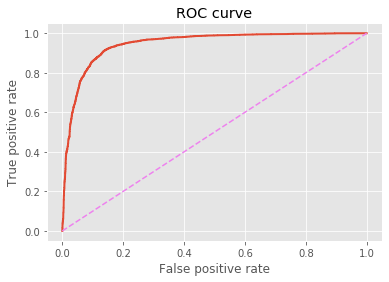

In [27]:
fpr, tpr, thresholds = roc_curve(y_test3, logreg_gs.predict_proba(X_test3)[:,1])

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])


plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve');
#print("ROC AUC score = ", roc_auc_score(y_test3, logreg3.predict_proba(X_test3)[:,1]))
print("Area under ROC score = ", auc(fpr,tpr))

## New DataFrame: Merge columns with Predictions

In [28]:
# include zipcodes in final table

il_df_OG_final = il_df_OG.drop(['y_mean','entry_date', 'city-state', 'State', 'City', 'month_no','year'], axis =1)
il_df_OG_final = il_df_OG_final.drop(['pendingratio_yy','avglistingprice_yy', 'pendinglistingcount_yy', 'priceincreasecount_yy','newlistingcount_yy','medianlistingprice_yy'], axis=1)

In [29]:
# Dataframe with zipcode and actual classifications
il_df_OG_final.head()

,zipcode,medianlistingprice,medianlistingprice_mm,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,...,pendinglistingcount,pendinglistingcount_mm,avglistingprice,avglistingprice_mm,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm,y_median
0,60002,250000.00,-0.0198,186.0,0.1481,-0.1878,44.75,0.0170,-0.0960,68,...,4.0,0.0000,294296,-0.0230,190.0,0.1446,-0.2149,0.0215,-0.0032,1
1,60004,349956.25,0.0000,407.0,0.1274,0.0970,38.00,-0.1364,-0.0256,206,...,21.5,0.1944,404348,0.0071,428.5,0.1306,0.0959,0.0528,0.0030,1
2,60005,355725.00,0.0047,232.5,0.2109,0.0764,35.50,-0.1744,-0.0405,98,...,15.5,0.1071,381492,-0.0065,248.0,0.2039,0.1121,0.0667,-0.0063,1
3,60007,299950.00,0.0166,199.5,0.2547,0.2627,37.25,0.0347,-0.0197,84,...,5.5,-0.0833,300549,0.0177,205.0,0.2424,0.2349,0.0276,-0.0102,0
4,60008,249950.00,0.0869,142.0,0.1545,0.0290,38.25,-0.0556,-0.0065,58,...,6.5,-0.0714,257328,0.0486,148.5,0.1423,0.0385,0.0458,-0.0111,1


In [ ]:
# create a dataframe with predicted and predict_proba as columns

In [30]:
# target vectors
y_actual = il_df_OG_final['y_median']

y_zipcode = il_df_OG_final['zipcode']

# feature matrixs
X = il_df_OG_final.drop(['y_median','zipcode'], axis=1)

In [31]:
# Predictions
y_predicted_FINAL = logreg_gs.predict(X)

In [32]:
y_predicted_proba_FINAL = logreg_gs.predict_proba(X)

In [34]:
y_predicted_proba_FINAL

array([[0.38742253, 0.61257747],
       [0.0315843 , 0.9684157 ],
       [0.15262829, 0.84737171],
       ...,
       [0.44299826, 0.55700174],
       [0.59246214, 0.40753786],
       [0.49505625, 0.50494375]])

### New DataFrame with predictions

In [40]:
il_df_final = X.join(y_zipcode)
il_df_final = il_df_final.join(y_actual)
il_df_final['predicted'] = pd.DataFrame(y_predicted_FINAL.astype(int))


In [45]:
il_df_final = il_df_final.join(pd.DataFrame(y_predicted_proba_FINAL.astype(float)))


In [48]:
il_df_final.columns

Index([    'medianlistingprice',  'medianlistingprice_mm',
           'activelistingcount',  'activelistingcount_mm',
        'activelistingcount_yy',           'daysonmarket',
              'daysonmarket_mm',        'daysonmarket_yy',
              'newlistingcount',     'newlistingcount_mm',
           'priceincreasecount',  'priceincreasecount_mm',
           'pricedecreasecount',  'pricedecreasecount_mm',
        'pricedecreasecount_yy',    'pendinglistingcount',
       'pendinglistingcount_mm',        'avglistingprice',
           'avglistingprice_mm',      'totallistingcount',
         'totallistingcount_mm',   'totallistingcount_yy',
                 'pendingratio',        'pendingratio_mm',
                      'zipcode',               'y_median',
                    'predicted',                        0,
                              1],
      dtype='object')

In [54]:
il_df_final = il_df_final.rename(columns={0: "proba_0",1: "proba_1" })

### Export Illinois Data with predictions

In [55]:


il_df_final.to_excel('il_data_FINAL_proba.xlsx', index=False, header = True)

## Coefficients

In [138]:
logreg_gs.coef_

array([[ 1.83020620e-08,  0.00000000e+00, -2.25494352e-03,
         0.00000000e+00,  0.00000000e+00,  5.82951402e-04,
        -4.33978828e+00,  0.00000000e+00,  2.83311982e-02,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        -3.76235658e-03,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00, -4.02533076e-07,
         0.00000000e+00, -3.68042757e-03,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [139]:
logreg_gs.intercept_

array([0.])

In [140]:
# create new scaled dataframe
X_sc = il_df.drop(['daysonmarket','daysonmarket_yy','daysonmarket_mm','y_median', 'pendingratio_yy','avglistingprice_yy', 'pendinglistingcount_yy', 'priceincreasecount_yy','newlistingcount_yy','medianlistingprice_yy'], axis=1)

In [141]:
scaler = StandardScaler()
scaler.fit(X_sc) 
X_scaled_final = pd.DataFrame(scaler.transform(X_sc),columns = X_sc.columns)

In [143]:
# fit model to scaled data
logreg_gs_fit_scaled = logreg_gs.fit(X_scaled_final, y)

In [144]:
# coefficients of model on scaled data
logreg_gs_fit_scaled.coef_

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.06291523,  0.06382707,  0.        ,  0.        ,  0.        ,
         0.02595903,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.63259373, -0.09174703,  0.        ,
         0.        ]])

In [147]:
X_scaled_final.columns

Index(['medianlistingprice', 'medianlistingprice_mm', 'activelistingcount',
       'activelistingcount_mm', 'activelistingcount_yy', 'newlistingcount',
       'newlistingcount_mm', 'priceincreasecount', 'priceincreasecount_mm',
       'pricedecreasecount', 'pricedecreasecount_mm', 'pricedecreasecount_yy',
       'pendinglistingcount', 'pendinglistingcount_mm', 'avglistingprice',
       'avglistingprice_mm', 'totallistingcount', 'totallistingcount_mm',
       'totallistingcount_yy', 'pendingratio', 'pendingratio_mm'],
      dtype='object')

In [137]:
X_test3.columns

Index(['medianlistingprice', 'medianlistingprice_mm', 'activelistingcount',
       'activelistingcount_mm', 'activelistingcount_yy', 'daysonmarket',
       'daysonmarket_mm', 'daysonmarket_yy', 'newlistingcount',
       'newlistingcount_mm', 'priceincreasecount', 'priceincreasecount_mm',
       'pricedecreasecount', 'pricedecreasecount_mm', 'pricedecreasecount_yy',
       'pendinglistingcount', 'pendinglistingcount_mm', 'avglistingprice',
       'avglistingprice_mm', 'totallistingcount', 'totallistingcount_mm',
       'totallistingcount_yy', 'pendingratio', 'pendingratio_mm'],
      dtype='object')

# Predictions for Market Averages

In [71]:
# create a dataframe with the averages for each zip code
il_df_OG_final_gb = il_df_OG.drop(['y_mean','entry_date', 'city-state', 'State', 'City', 'month_no','year'], axis =1)
il_df_OG_final_gb = il_df_OG_final_gb.drop(['pendingratio_yy','avglistingprice_yy', 'pendinglistingcount_yy', 'priceincreasecount_yy','newlistingcount_yy','medianlistingprice_yy'], axis=1)

In [72]:
il_df_OG_final_gb.head()

,zipcode,medianlistingprice,medianlistingprice_mm,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,...,pendinglistingcount,pendinglistingcount_mm,avglistingprice,avglistingprice_mm,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm,y_median
0,60002,250000.00,-0.0198,186.0,0.1481,-0.1878,44.75,0.0170,-0.0960,68,...,4.0,0.0000,294296,-0.0230,190.0,0.1446,-0.2149,0.0215,-0.0032,1
1,60004,349956.25,0.0000,407.0,0.1274,0.0970,38.00,-0.1364,-0.0256,206,...,21.5,0.1944,404348,0.0071,428.5,0.1306,0.0959,0.0528,0.0030,1
2,60005,355725.00,0.0047,232.5,0.2109,0.0764,35.50,-0.1744,-0.0405,98,...,15.5,0.1071,381492,-0.0065,248.0,0.2039,0.1121,0.0667,-0.0063,1
3,60007,299950.00,0.0166,199.5,0.2547,0.2627,37.25,0.0347,-0.0197,84,...,5.5,-0.0833,300549,0.0177,205.0,0.2424,0.2349,0.0276,-0.0102,0
4,60008,249950.00,0.0869,142.0,0.1545,0.0290,38.25,-0.0556,-0.0065,58,...,6.5,-0.0714,257328,0.0486,148.5,0.1423,0.0385,0.0458,-0.0111,1


In [73]:
# target vectors
y_actual_gb = il_df_OG_final_gb['y_median']

y_zipcode_gb = il_df_OG_final_gb['zipcode']

# feature matrixs (keep zip code for grouping and then drop when running model)
X_gb = il_df_OG_final_gb.drop(['y_median'], axis=1)

In [74]:
X_gb.head()

,zipcode,medianlistingprice,medianlistingprice_mm,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,...,pricedecreasecount_yy,pendinglistingcount,pendinglistingcount_mm,avglistingprice,avglistingprice_mm,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm
0,60002,250000.00,-0.0198,186.0,0.1481,-0.1878,44.75,0.0170,-0.0960,68,...,0.0417,4.0,0.0000,294296,-0.0230,190.0,0.1446,-0.2149,0.0215,-0.0032
1,60004,349956.25,0.0000,407.0,0.1274,0.0970,38.00,-0.1364,-0.0256,206,...,0.6667,21.5,0.1944,404348,0.0071,428.5,0.1306,0.0959,0.0528,0.0030
2,60005,355725.00,0.0047,232.5,0.2109,0.0764,35.50,-0.1744,-0.0405,98,...,0.4167,15.5,0.1071,381492,-0.0065,248.0,0.2039,0.1121,0.0667,-0.0063
3,60007,299950.00,0.0166,199.5,0.2547,0.2627,37.25,0.0347,-0.0197,84,...,0.7500,5.5,-0.0833,300549,0.0177,205.0,0.2424,0.2349,0.0276,-0.0102
4,60008,249950.00,0.0869,142.0,0.1545,0.0290,38.25,-0.0556,-0.0065,58,...,-0.0714,6.5,-0.0714,257328,0.0486,148.5,0.1423,0.0385,0.0458,-0.0111


In [75]:
# GroupBy zipcode
X_gb_zip = X_gb.groupby('zipcode').mean()
X_gb_zip = X_gb_zip.reset_index()
X_gb_zip.head(25)

,zipcode,medianlistingprice,medianlistingprice_mm,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,...,pricedecreasecount_yy,pendinglistingcount,pendinglistingcount_mm,avglistingprice,avglistingprice_mm,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm
0,60002,2.247220e+05,0.004396,225.021429,-0.000564,-0.022050,76.075000,0.005541,-0.067003,54.114286,...,0.039277,17.278571,0.010664,2.629740e+05,0.004021,242.300000,-0.001270,-0.021220,0.081173,0.000303
1,60004,3.589410e+05,0.001746,299.728571,0.010277,-0.013443,52.317857,0.009717,-0.067291,108.200000,...,0.178169,28.692857,0.031809,4.053826e+05,0.002439,328.421429,0.009187,0.038484,0.120820,0.000759
2,60005,3.354846e+05,0.004554,193.314286,0.007443,-0.020923,53.753571,0.005161,-0.064044,65.800000,...,0.152189,16.714286,0.053603,3.712976e+05,0.003474,210.028571,0.007096,0.015343,0.102357,0.000951
3,60007,2.484679e+05,0.005444,165.764286,0.007090,-0.070457,57.017857,0.010309,-0.081139,53.914286,...,0.121659,17.992857,0.022850,2.593196e+05,0.004791,183.757143,0.005833,-0.041616,0.118611,0.000394
4,60008,2.199282e+05,0.005383,116.264286,0.006420,-0.039223,53.657143,0.005009,-0.077696,40.000000,...,0.165960,12.742857,0.017533,2.422763e+05,0.002966,129.007143,0.004393,-0.010481,0.142280,0.000651
5,60010,6.320280e+05,0.001314,707.385714,0.004410,0.036003,93.307143,0.008997,-0.024189,138.000000,...,0.128647,34.885714,0.010113,8.740854e+05,-0.000666,742.271429,0.004394,0.049793,0.052297,0.000363
6,60012,3.398695e+05,0.001823,108.314286,0.005583,-0.004296,87.253571,0.009733,-0.086547,22.742857,...,0.112684,7.342857,0.118163,4.198636e+05,-0.000723,115.657143,0.006937,0.034439,0.066841,0.001721
7,60013,2.460548e+05,0.004847,199.614286,0.000307,-0.042076,71.057143,0.005383,-0.100057,51.800000,...,0.048643,17.678571,0.018007,2.842680e+05,0.004196,217.292857,-0.000220,-0.038151,0.097654,0.000630
8,60014,2.484120e+05,0.005771,362.200000,-0.001929,-0.053737,71.792857,0.004553,-0.109527,94.714286,...,0.013556,29.078571,0.006953,2.997068e+05,0.003126,391.278571,-0.002371,-0.049347,0.093726,0.000634
9,60015,6.481057e+05,0.001029,254.142857,0.010033,-0.004741,72.071429,0.013039,-0.018713,65.657143,...,0.170574,18.907143,0.032694,7.908024e+05,0.000486,273.050000,0.009867,0.057513,0.089543,0.000906


## Predict demand based on zipcode's average

In [76]:
# target vectors

X_gb_zip_zipcol = X_gb_zip['zipcode']

# feature matrix
X_gb_pred = X_gb_zip.drop(['zipcode'], axis=1)

In [88]:
# Predictions for Groupby

#hard classification
y_gb_predicted = logreg_gs.predict(X_gb_pred)
#soft classification
y_gb_predicted_proba = logreg_gs.predict_proba(X_gb_pred)

In [80]:
X_gb_pred.head()

,medianlistingprice,medianlistingprice_mm,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,newlistingcount_mm,...,pricedecreasecount_yy,pendinglistingcount,pendinglistingcount_mm,avglistingprice,avglistingprice_mm,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm
0,224721.985714,0.004396,225.021429,-0.000564,-0.022050,76.075000,0.005541,-0.067003,54.114286,0.064460,...,0.039277,17.278571,0.010664,262973.985714,0.004021,242.300000,-0.001270,-0.021220,0.081173,0.000303
1,358940.971429,0.001746,299.728571,0.010277,-0.013443,52.317857,0.009717,-0.067291,108.200000,0.075544,...,0.178169,28.692857,0.031809,405382.557143,0.002439,328.421429,0.009187,0.038484,0.120820,0.000759
2,335484.614286,0.004554,193.314286,0.007443,-0.020923,53.753571,0.005161,-0.064044,65.800000,0.079164,...,0.152189,16.714286,0.053603,371297.557143,0.003474,210.028571,0.007096,0.015343,0.102357,0.000951
3,248467.850000,0.005444,165.764286,0.007090,-0.070457,57.017857,0.010309,-0.081139,53.914286,0.091079,...,0.121659,17.992857,0.022850,259319.557143,0.004791,183.757143,0.005833,-0.041616,0.118611,0.000394
4,219928.189286,0.005383,116.264286,0.006420,-0.039223,53.657143,0.005009,-0.077696,40.000000,0.053343,...,0.165960,12.742857,0.017533,242276.285714,0.002966,129.007143,0.004393,-0.010481,0.142280,0.000651


## New DataFrame for Groupby

In [85]:

il_df_final_gb = X_gb_pred.join(X_gb_zip_zipcol)

# Add the model's hard classifier prediction
il_df_final_gb['predicted'] = pd.DataFrame(y_gb_predicted.astype(int))

In [90]:
# Add the model's soft classification
il_df_final_gb = il_df_final_gb.join(pd.DataFrame(y_gb_predicted_proba.astype(float)))
il_df_final_gb = il_df_final_gb.rename(columns={0: "proba_0",1: "proba_1" })
il_df_final_gb.head(20)

,medianlistingprice,medianlistingprice_mm,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,daysonmarket_mm,daysonmarket_yy,newlistingcount,newlistingcount_mm,...,avglistingprice_mm,totallistingcount,totallistingcount_mm,totallistingcount_yy,pendingratio,pendingratio_mm,zipcode,predicted,proba_0,proba_1
0,2.247220e+05,0.004396,225.021429,-0.000564,-0.022050,76.075000,0.005541,-0.067003,54.114286,0.064460,...,0.004021,242.300000,-0.001270,-0.021220,0.081173,0.000303,60002,0,0.536582,0.463418
1,3.589410e+05,0.001746,299.728571,0.010277,-0.013443,52.317857,0.009717,-0.067291,108.200000,0.075544,...,0.002439,328.421429,0.009187,0.038484,0.120820,0.000759,60004,1,0.319194,0.680806
2,3.354846e+05,0.004554,193.314286,0.007443,-0.020923,53.753571,0.005161,-0.064044,65.800000,0.079164,...,0.003474,210.028571,0.007096,0.015343,0.102357,0.000951,60005,1,0.409791,0.590209
3,2.484679e+05,0.005444,165.764286,0.007090,-0.070457,57.017857,0.010309,-0.081139,53.914286,0.091079,...,0.004791,183.757143,0.005833,-0.041616,0.118611,0.000394,60007,1,0.440540,0.559460
4,2.199282e+05,0.005383,116.264286,0.006420,-0.039223,53.657143,0.005009,-0.077696,40.000000,0.053343,...,0.002966,129.007143,0.004393,-0.010481,0.142280,0.000651,60008,1,0.445516,0.554484
5,6.320280e+05,0.001314,707.385714,0.004410,0.036003,93.307143,0.008997,-0.024189,138.000000,0.066304,...,-0.000666,742.271429,0.004394,0.049793,0.052297,0.000363,60010,0,0.772360,0.227640
6,3.398695e+05,0.001823,108.314286,0.005583,-0.004296,87.253571,0.009733,-0.086547,22.742857,0.137207,...,-0.000723,115.657143,0.006937,0.034439,0.066841,0.001721,60012,0,0.565437,0.434563
7,2.460548e+05,0.004847,199.614286,0.000307,-0.042076,71.057143,0.005383,-0.100057,51.800000,0.073449,...,0.004196,217.292857,-0.000220,-0.038151,0.097654,0.000630,60013,0,0.512691,0.487309
8,2.484120e+05,0.005771,362.200000,-0.001929,-0.053737,71.792857,0.004553,-0.109527,94.714286,0.049583,...,0.003126,391.278571,-0.002371,-0.049347,0.093726,0.000634,60014,1,0.490313,0.509687
9,6.481057e+05,0.001029,254.142857,0.010033,-0.004741,72.071429,0.013039,-0.018713,65.657143,0.074050,...,0.000486,273.050000,0.009867,0.057513,0.089543,0.000906,60015,0,0.560460,0.439540


## Export Groupby Data

In [91]:

il_df_final_gb.to_excel('il_df_final_gb.xlsx', index=False, header = True)

In [94]:
il_df_OG[il_df_OG['zipcode'] == 60657]

,entry_date,zipcode,city-state,medianlistingprice,medianlistingprice_mm,medianlistingprice_yy,activelistingcount,activelistingcount_mm,activelistingcount_yy,daysonmarket,...,totallistingcount_yy,pendingratio,pendingratio_mm,pendingratio_yy,City,State,month_no,year,y_median,y_mean
284,2019-04-01,60657,"Chicago, IL",469500.0,0.0432,-0.0609,582.0,0.0838,0.0139,33.00,...,-0.0231,0.1280,0.0219,-0.0427,Chicago,IL,4,2019,1,1
813,2019-03-01,60657,"Chicago, IL",450049.0,0.0112,-0.1133,537.0,0.1258,0.0560,36.00,...,0.0321,0.1061,0.0286,-0.0256,Chicago,IL,3,2019,0,0
1342,2019-02-01,60657,"Chicago, IL",445050.0,0.0092,-0.1434,477.0,0.2184,0.0659,34.00,...,0.0405,0.0776,0.0329,-0.0263,Chicago,IL,2,2019,1,1
1872,2019-01-01,60657,"Chicago, IL",441000.0,-0.0199,-0.1968,391.5,-0.0612,0.0890,67.00,...,0.0302,0.0447,-0.0081,-0.0596,Chicago,IL,1,2019,0,0
2401,2018-12-01,60657,"Chicago, IL",449950.0,-0.0318,-0.1819,417.0,-0.1429,0.0720,61.00,...,0.0281,0.0528,-0.0110,-0.0449,Chicago,IL,12,2018,0,0
2931,2018-11-01,60657,"Chicago, IL",464750.0,-0.0109,-0.1426,486.5,-0.0957,0.0021,47.00,...,-0.0245,0.0637,-0.0097,-0.0290,Chicago,IL,11,2018,0,0
3458,2018-10-01,60657,"Chicago, IL",469850.0,-0.0313,-0.1051,538.0,0.0189,-0.0037,38.00,...,-0.0245,0.0734,-0.0099,-0.0229,Chicago,IL,10,2018,0,0
3987,2018-09-01,60657,"Chicago, IL",485050.0,-0.0175,-0.0757,528.0,0.0000,-0.0469,35.00,...,-0.0676,0.0833,-0.0085,-0.0241,Chicago,IL,9,2018,1,1
4517,2018-08-01,60657,"Chicago, IL",493712.5,0.0095,-0.0243,528.0,-0.0347,-0.0417,35.75,...,-0.0588,0.0919,-0.0434,-0.0198,Chicago,IL,8,2018,1,1
5045,2018-07-01,60657,"Chicago, IL",489050.0,-0.0070,-0.0663,547.0,-0.0891,-0.0073,39.00,...,-0.0312,0.1353,0.0062,-0.0281,Chicago,IL,7,2018,0,0
